## General python Imports

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.metrics import roc_curve, roc_auc_score

## Importing libraries for Neural Network

In [2]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.utils import to_categorical
from keras.datasets import mnist
from keras.utils.vis_utils import model_to_dot
from IPython.display import SVG
from sklearn.model_selection import train_test_split
from sklearn import metrics
from keras.models import load_model
from keras.layers.core import Dense, Activation
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier

## Importing libraries for NN visualization

In [3]:
from ann_visualizer.visualize import ann_viz
from IPython.display import IFrame


## Importing libraries for Random Forest

In [4]:
from sklearn.preprocessing import Normalizer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

## Importing libraries for Decision Tree

In [5]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

## Start of all the functions used 

In [6]:
# Function to check how many categories each column has with the OBJECT datatype
def checkUnique(dfCheck):
    #looping through the columns of each dataset
    for column in dfCheck.columns:
        #Checking if the column is object
        if (dfCheck[column].dtypes == 'object'):
            #saving the count of each unique column
            categoryCount = len(dfCheck[column].unique())
            #checking the distribution for the given column
            distNumber = dfCheck[column].value_counts().sort_values(ascending=False)
            print(f'Column: {column} has {categoryCount} unique categories')
            print(f'Distribution for {column}')
            print(distNumber)
            print()
            

In [7]:
# Function used to created new column names for the new categories
def createLabel(stringName, dfCheck):
    #creating the new variable name for the column Name
    newCategory= stringName
    newCat = newCategory+'_'
    #sorting the categories of the df
    dfSorted = sorted(dfCheck[stringName].unique())
    #creating a unique category name for the column Name
    categoryName=[newCat + x for x in dfSorted]
    return categoryName

In [8]:
# Function used to create a new df with the enconded df
def createNewCategorical(dfEnconded, colunmNames):
    #using sklearn OneHOTEncoder to trasform to a numeric array
    hotEncoder = OneHotEncoder(categories='auto')
    newDfEnconded =  hotEncoder.fit_transform(dfEnconded)
    #creating the new dataset with the new categorical columns
    finalDF = pd.DataFrame(newDfEnconded.toarray(),columns=colunmNames)
    return finalDF

In [9]:
#function to check which new catergory is missing on the test dataset
def checkMissingColumn(dfCheckTrain, dfCheckTest, stringCheck, dfName):
    #adding the train and test data set to a list to check for the missing columns
    trainList = dfCheckTrain[stringCheck].tolist()
    testList = dfCheckTest[stringCheck].tolist()
    #finding the values missing on the test dataset
    missingList = list(set(trainList) - set(testList))
    checkCategory = stringCheck+'_'
    #finding the missing columns
    missingColumns=[checkCategory + x for x in missingList]
    print(f'Columns missing on {dfName} data sets are:')
    print(missingColumns)
    print()
    return missingColumns

In [10]:
#function to add the missing column to a df
def addMissingColumn(dfAdd, columnList):
    #loop to add the missing column and put 0 on them
    newDfTest = dfAdd
    for columnName in columnList:
        newDfTest[columnName] = 0

    return newDfTest

In [11]:
#Function to join the categorical and general df for train and test dataset.
#It will also replace the final label column with a numerical value
def getFinalDF(dfCheckOriginal, dfCheckCategorical):
    #joining the two datasets and droping the old object columns
    dfCheckOriginal = dfCheckOriginal.reset_index(drop=True)
    FinalDF=dfCheckOriginal.join(dfCheckCategorical)
    FinalDF.drop('flag', axis=1, inplace=True)
    FinalDF.drop('protocol_type', axis=1, inplace=True)
    FinalDF.drop('service', axis=1, inplace=True)
    print(FinalDF.shape)
    return FinalDF

In [12]:
#Function to create our Neural Network Model with 3 Hidden layers
def createModel():
    model = Sequential()
    #118 is output dimension
    model.add(Dense(118,input_dim =118,activation = 'relu',kernel_initializer='random_uniform'))
    #in next layer we do not specify the input_dim as the model is sequential so output of previous layer is input to next layer
    model.add(Dense(1,activation='sigmoid',kernel_initializer='random_uniform'))
    #23 type of clases: 'normal.', 'buffer_overflow.', 'loadmodule.', 'perl.', 'neptune.','smurf.', 'guess_passwd.', 'pod.', 'teardrop.', 'portsweep.',
       #'ipsweep.', 'land.', 'ftp_write.', 'back.', 'imap.', 'satan.',
       #'phf.', 'nmap.', 'multihop.', 'warezmaster.', 'warezclient.',
       #'spy.', 'rootkit.'
    model.add(Dense(23,activation='softmax'))
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=3, verbose=1, mode='auto')
    #loss is categorical_crossentropy which specifies that we have multiple classes
    model.compile(loss ='categorical_crossentropy',optimizer = 'adam',metrics = ['accuracy'])
    return model

In [13]:
#Function to create our Neural Network Model with 3 Hidden layers Removing objectTypes
def createModelWithout():
    model = Sequential()
    #118 is output dimension
    model.add(Dense(118,input_dim =38,activation = 'relu',kernel_initializer='random_uniform'))
    #in next layer we do not specify the input_dim as the model is sequential so output of previous layer is input to next layer
    model.add(Dense(1,activation='sigmoid',kernel_initializer='random_uniform'))
    #23 type of clases: 'normal.', 'buffer_overflow.', 'loadmodule.', 'perl.', 'neptune.','smurf.', 'guess_passwd.', 'pod.', 'teardrop.', 'portsweep.',
       #'ipsweep.', 'land.', 'ftp_write.', 'back.', 'imap.', 'satan.',
       #'phf.', 'nmap.', 'multihop.', 'warezmaster.', 'warezclient.',
       #'spy.', 'rootkit.'
    model.add(Dense(23,activation='softmax'))
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=3, verbose=1, mode='auto')
    #loss is categorical_crossentropy which specifies that we have multiple classes
    model.compile(loss ='categorical_crossentropy',optimizer = 'adam',metrics = ['accuracy'])
    return model

In [14]:
# Function to create our second Neural Network with 5 Hidden layers
def createModel2():
    model = Sequential()
    #118 is output dimension
    model.add(Dense(118,input_dim =118,activation = 'relu', kernel_initializer='random_uniform'))
    #second layer we do not specify the input_dim as the model is sequential so output of previous layer is input to next layer
    model.add(Dense(60,activation = 'relu', kernel_initializer='random_uniform'))
    model.add(Dense(30,activation = 'relu', kernel_initializer='random_uniform'))
    #adding another hidden layer
    model.add(Dense(1,activation='sigmoid',kernel_initializer='random_uniform'))
    #23 type of clases: 'normal.', 'buffer_overflow.', 'loadmodule.', 'perl.', 'neptune.','smurf.', 'guess_passwd.', 'pod.', 'teardrop.', 'portsweep.',
       #'ipsweep.', 'land.', 'ftp_write.', 'back.', 'imap.', 'satan.',
       #'phf.', 'nmap.', 'multihop.', 'warezmaster.', 'warezclient.',
       #'spy.', 'rootkit.'
    model.add(Dense(23,activation='softmax'))
    #loss is categorical_crossentropy which specifies that we have multiple classes
    model.compile(loss ='categorical_crossentropy',optimizer = 'adam',metrics = ['accuracy'])
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=3, verbose=1, mode='auto')
    return model

In [15]:
# Function to create our Random Forest Model with given parameter
def createModelRF(nEstimators, maxDepth, randomState):
    #creating random Forest Model
    modelRF = RandomForestClassifier(n_estimators=nEstimators, max_depth=maxDepth, random_state=randomState)
    return modelRF 

In [16]:
# Function to create our Decision Tree
def createModelDT():
    #creating random Forest Model
    decision_tree = DecisionTreeClassifier(criterion='gini',class_weight='balanced')
    return decision_tree 

In [17]:
#Function to create a scaled dataset
def scaleData(dfCheck):
    # setting the scale and returning the scaled df
    sc = preprocessing.StandardScaler().fit(dfCheck)
    dfScaled = sc.transform(dfCheck) 
    return dfScaled

In [18]:
#function used to create quick graphs for a given column Name
def plotGraph(columnName):
    plt.title(columnName)
    df[columnName].value_counts().plot(kind="bar")

In [19]:
#function to plot a single tree
def plotTree(model, Fnames, Tnames):
    #variables for the target and feature names
    fn=Fnames
    cn=Tnames
    fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (20,5), dpi=900)
    tree.plot_tree(model,feature_names = fn, class_names=cn, filled = True);
    fig.savefig('SingleTree.png')

In [20]:
#function used to display a given number of trees that ramdom forest create with the estimator
def plotMultipleTrees(model, Fnames, Tnames, NumEstimator):
    #target and features names
    fn=Fnames
    cn=Tnames
    fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (25,4), dpi=900)
    #plotting desired trees
    for index in range(0, NumEstimator):
        tree.plot_tree(model.estimators_[index],feature_names = fn, class_names=cn,filled = True,ax = axes[index]);
        axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
    fig.savefig('RandomTrees.png')

In [21]:
#function used to plot the final results of our models with corresponding accuracies
def plotResults(DfAcc, RFAcc, NNAcc):
    dfCheck = pd.DataFrame({'Model':['LogReg', 'DecTree', 'RF', 'NN3', 'NN5'], 
                         'Accuracy':[85.72, (100*round(DfAcc,2)), (100*round(RFAcc,2)),(100*round(NNAcc,2)), 99.15]})
    plt.figure(figsize=(12, 8))
    splot=sns.barplot(x="Model",y="Accuracy",data=dfCheck)
    for p in splot.patches:
        splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
    plt.xlabel("Model", size=14)
    plt.ylabel("Accuracy", size=14)

In [22]:
def plotNN():
    model = Sequential()
    #118 is output dimension
    model.add(Dense(512,input_dim =118,activation = 'relu',kernel_initializer='random_uniform'))
    #in next layer we do not specify the input_dim as the model is sequential so output of previous layer is input to next layer
    model.add(Dense(180,activation='sigmoid',kernel_initializer='random_uniform'))
    #23 type of clases: 'normal.', 'buffer_overflow.', 'loadmodule.', 'perl.', 'neptune.','smurf.', 'guess_passwd.', 'pod.', 'teardrop.', 'portsweep.',
       #'ipsweep.', 'land.', 'ftp_write.', 'back.', 'imap.', 'satan.',
       #'phf.', 'nmap.', 'multihop.', 'warezmaster.', 'warezclient.',
       #'spy.', 'rootkit.'
    model.add(Dense(80,activation='sigmoid',kernel_initializer='random_uniform'))
    model.add(Dense(23,activation='softmax'))
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=3, verbose=1, mode='auto')
    #loss is categorical_crossentropy which specifies that we have multiple classes
    model.compile(loss ='categorical_crossentropy',optimizer = 'adam',metrics = ['accuracy'])
    ann_viz(model)
    

## Names of the headers

In [23]:
labelNames = ["duration","protocol_type","service","flag","src_bytes",
    "dst_bytes","land","wrong_fragment","urgent","hot","num_failed_logins",
    "logged_in","num_compromised","root_shell","su_attempted","num_root",
    "num_file_creations","num_shells","num_access_files","num_outbound_cmds",
    "is_host_login","is_guest_login","count","srv_count","serror_rate",
    "srv_serror_rate","rerror_rate","srv_rerror_rate","same_srv_rate",
    "diff_srv_rate","srv_diff_host_rate","dst_host_count","dst_host_srv_count",
    "dst_host_same_srv_rate","dst_host_diff_srv_rate","dst_host_same_src_port_rate",
    "dst_host_srv_diff_host_rate","dst_host_serror_rate","dst_host_srv_serror_rate",
    "dst_host_rerror_rate","dst_host_srv_rerror_rate","label"]

## Reading the csv dataset

In [24]:
df = pd.read_csv('kddcup.data_10_percent_corrected',header=None, names = labelNames)

In [25]:
df.shape

(494021, 42)

## Ploting a heat map to check for NULL's

<AxesSubplot:>

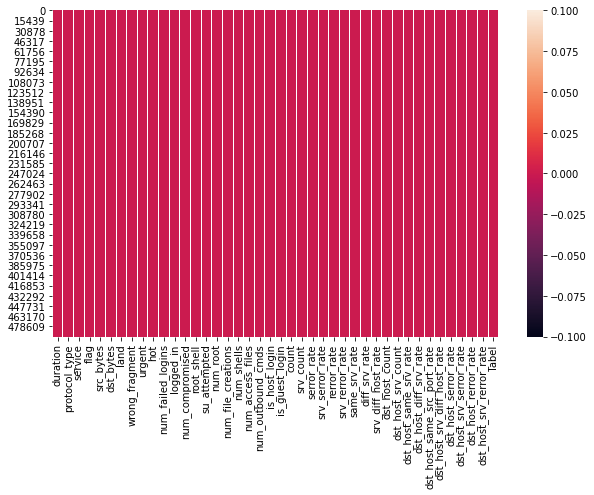

In [26]:
plt.subplots(figsize=(10,6))
sns.heatmap(df.isnull())

## Log-scale distribution of the dataset

<Figure size 432x288 with 0 Axes>

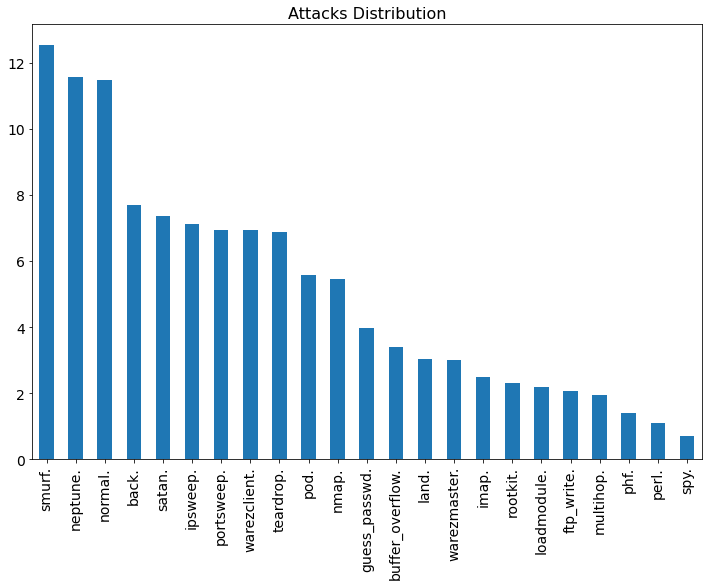

In [27]:
#log-scaled distribution
plt.clf()
plt.figure(figsize=(12,8))
params = {'axes.titlesize':'16','xtick.labelsize':'14','ytick.labelsize':'14'}
matplotlib.rcParams.update(params)
plt.title('Attacks Distribution')
df['label'].value_counts().apply(np.log).plot(kind='bar')
plt.show()

## Correlation matrix of the dataset

Text(0.5, 1.0, 'Correlation Matrix')

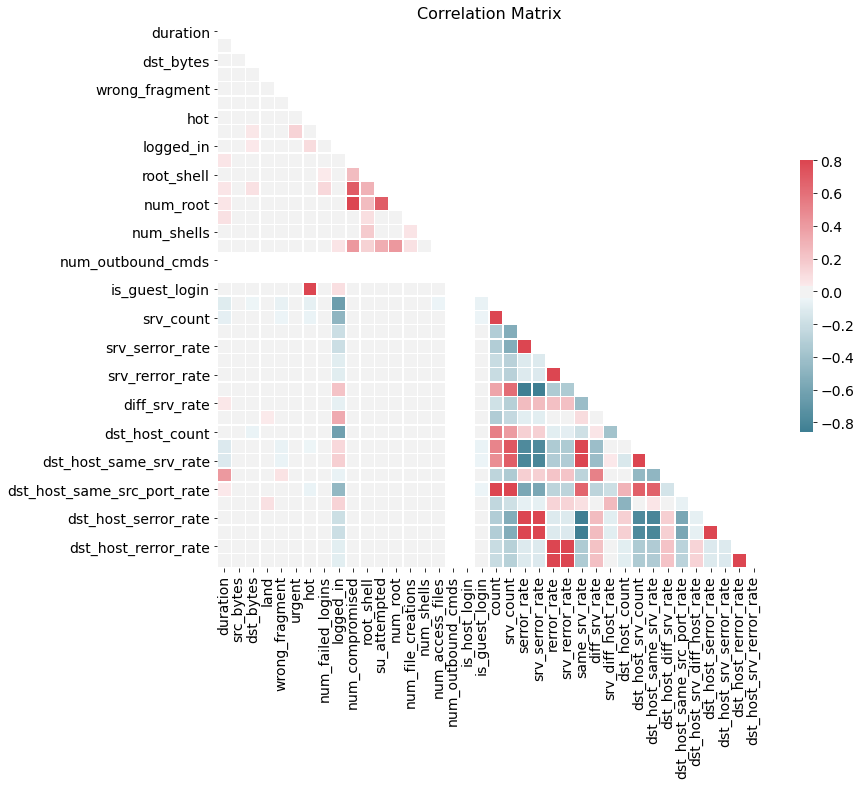

In [28]:
#putting in a different variable the correlation matrix
corr = df.corr()

#plotting the correlation matrix
dfMask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(14,10))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
#using sns heatmap for the plotting
sns.heatmap(corr,mask=dfMask, cmap=cmap, vmax=.8, center=0,square=True, linewidths=.5, cbar_kws={'shrink': .5})
plt.title('Correlation Matrix', fontsize = 16)

## Splitting the data for Train and Test

In [29]:
dfTrain, dfTest = train_test_split(df, test_size=0.2)

In [30]:
#printing the shape of all Datasets
print(f'Original Dataset: {df.shape} ,Train Dataset: {dfTrain.shape}, Test Dataset:{dfTest.shape}')

Original Dataset: (494021, 42) ,Train Dataset: (395216, 42), Test Dataset:(98805, 42)


## Checking the distribution of the Train and Test Datasets

In [31]:
#creating a distribution based on the label name
distTrain = dfTrain['label'].value_counts()
distTest = dfTest['label'].value_counts()
print(f'Distribution for Training set: {distTrain}')

Distribution for Training set: smurf.              224752
neptune.             85681
normal.              77799
back.                 1764
satan.                1269
ipsweep.               985
portsweep.             828
warezclient.           805
teardrop.              788
pod.                   213
nmap.                  187
guess_passwd.           45
buffer_overflow.        23
land.                   20
warezmaster.            13
imap.                   10
rootkit.                 8
loadmodule.              8
multihop.                6
phf.                     4
perl.                    3
ftp_write.               3
spy.                     2
Name: label, dtype: int64


In [32]:
# Training dataset distribution
print(f'Distribution for Training set: {distTest}')

Distribution for Training set: smurf.              56038
neptune.            21520
normal.             19479
back.                 439
satan.                320
ipsweep.              262
warezclient.          215
portsweep.            212
teardrop.             191
pod.                   51
nmap.                  44
guess_passwd.           8
warezmaster.            7
buffer_overflow.        7
ftp_write.              5
rootkit.                2
imap.                   2
loadmodule.             1
land.                   1
multihop.               1
Name: label, dtype: int64


## Checking the datatypes

In [33]:
print(f'Train Datatypes:{dfTrain.dtypes}')

Train Datatypes:duration                         int64
protocol_type                   object
service                         object
flag                            object
src_bytes                        int64
dst_bytes                        int64
land                             int64
wrong_fragment                   int64
urgent                           int64
hot                              int64
num_failed_logins                int64
logged_in                        int64
num_compromised                  int64
root_shell                       int64
su_attempted                     int64
num_root                         int64
num_file_creations               int64
num_shells                       int64
num_access_files                 int64
num_outbound_cmds                int64
is_host_login                    int64
is_guest_login                   int64
count                            int64
srv_count                        int64
serror_rate                    float64
srv_serro

## Checking how many unique Categories each column has and corresponding distribution

In [34]:
#checking how many unique categories as well as the distribution on the Train dataset
checkUnique(dfTrain)

Column: protocol_type has 3 unique categories
Distribution for protocol_type
icmp    226999
tcp     151841
udp      16376
Name: protocol_type, dtype: int64

Column: service has 64 unique categories
Distribution for service
ecr_i      225244
private     88720
http        51240
smtp         7852
other        5817
            ...  
IRC            36
X11            10
urh_i          10
tim_i           7
tftp_u          1
Name: service, Length: 64, dtype: int64

Column: flag has 11 unique categories
Distribution for flag
SF        302804
S0         69446
REJ        21602
RSTR         714
RSTO         470
SH            84
S1            47
S2            22
RSTOS0        10
S3             9
OTH            8
Name: flag, dtype: int64

Column: label has 23 unique categories
Distribution for label
smurf.              224752
neptune.             85681
normal.              77799
back.                 1764
satan.                1269
ipsweep.               985
portsweep.             828
warezclient.  

In [35]:
#checking how many unique categories as well as the distribution on the Test dataset
checkUnique(dfTest)

Column: protocol_type has 3 unique categories
Distribution for protocol_type
icmp    56603
tcp     38224
udp      3978
Name: protocol_type, dtype: int64

Column: service has 64 unique categories
Distribution for service
ecr_i      56156
private    22173
http       13053
smtp        1871
other       1420
           ...  
IRC            7
urh_i          4
pm_dump        1
red_i          1
X11            1
Name: service, Length: 64, dtype: int64

Column: flag has 10 unique categories
Distribution for flag
SF        75636
S0        17561
REJ        5273
RSTR        189
RSTO        109
SH           23
S1           10
S2            2
RSTOS0        1
S3            1
Name: flag, dtype: int64

Column: label has 20 unique categories
Distribution for label
smurf.              56038
neptune.            21520
normal.             19479
back.                 439
satan.                320
ipsweep.              262
warezclient.          215
portsweep.            212
teardrop.             191
pod.      

## Two options: (1) Add each category to the dataset. (2) Remove these object columns 

## Option 1
* It will help the neural network


In [36]:
#creating the 3 new columns of services, protocol_type, and flag
columnNames = ['service', 'flag', 'protocol_type']

#create a new df for those columns
dfTrain_cat = dfTrain[columnNames]
dfTest_cat = dfTest[columnNames]

In [37]:
dfTrain_cat.sample(10)

,service,flag,protocol_type
168894,ecr_i,SF,icmp
9406,ecr_i,SF,icmp
296732,ecr_i,SF,icmp
234483,ecr_i,SF,icmp
94161,ecr_i,SF,icmp
324647,ecr_i,SF,icmp
259641,ecr_i,SF,icmp
331114,ecr_i,SF,icmp
395875,private,S0,tcp
390063,private,S0,tcp


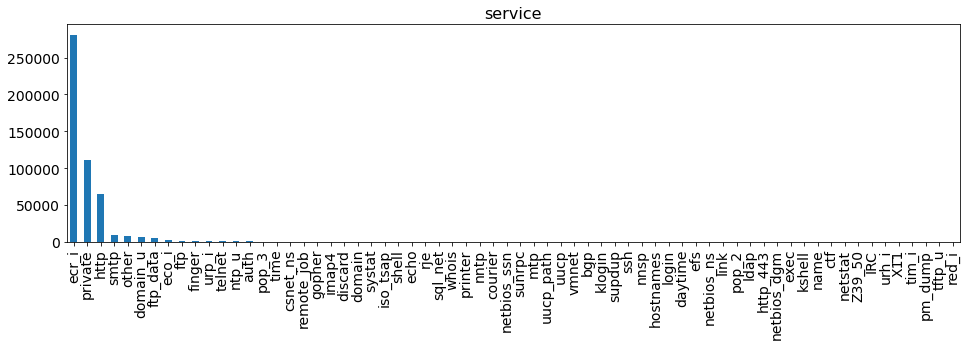

In [38]:
plt.figure(figsize=(16,4))
plotGraph('service')

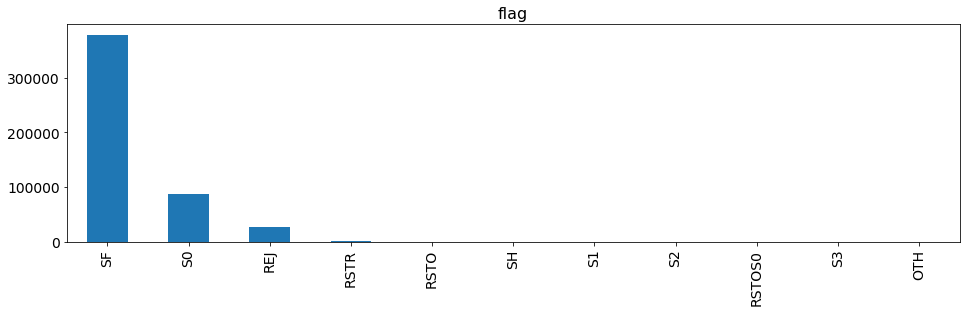

In [39]:
plt.figure(figsize=(16,4))
plotGraph('flag')

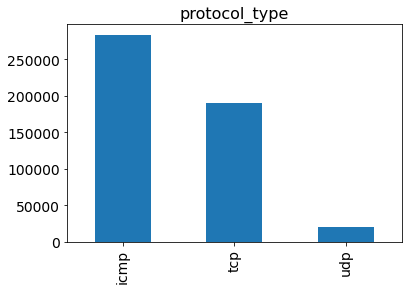

In [40]:
plotGraph('protocol_type')

In [41]:
#creating the new column names for the new categories on the Train dataset
ServiceNamesTrain = createLabel('service',dfTrain)
FlagNamesTrain = createLabel('flag',dfTrain)
protocolNamesTrain = createLabel('protocol_type',dfTrain)
#adding all columns name to a single set
allColumnsTrain = ServiceNamesTrain + FlagNamesTrain + protocolNamesTrain

In [42]:
allColumnsTrain

['service_IRC',
 'service_X11',
 'service_Z39_50',
 'service_auth',
 'service_bgp',
 'service_courier',
 'service_csnet_ns',
 'service_ctf',
 'service_daytime',
 'service_discard',
 'service_domain',
 'service_domain_u',
 'service_echo',
 'service_eco_i',
 'service_ecr_i',
 'service_efs',
 'service_exec',
 'service_finger',
 'service_ftp',
 'service_ftp_data',
 'service_gopher',
 'service_hostnames',
 'service_http',
 'service_http_443',
 'service_imap4',
 'service_iso_tsap',
 'service_klogin',
 'service_kshell',
 'service_ldap',
 'service_link',
 'service_login',
 'service_mtp',
 'service_name',
 'service_netbios_dgm',
 'service_netbios_ns',
 'service_netbios_ssn',
 'service_netstat',
 'service_nnsp',
 'service_nntp',
 'service_ntp_u',
 'service_other',
 'service_pop_2',
 'service_pop_3',
 'service_printer',
 'service_private',
 'service_remote_job',
 'service_rje',
 'service_shell',
 'service_smtp',
 'service_sql_net',
 'service_ssh',
 'service_sunrpc',
 'service_supdup',
 'service_s

In [43]:
#creating the new column names for the new categories on the Test dataset
ServiceNamesTest = createLabel('service',dfTest)
FlagNamesTest = createLabel('flag',dfTest)
protocolNamesTest = createLabel('protocol_type',dfTest)
#adding all columns name to a single set
allColumnsTest = ServiceNamesTest + FlagNamesTest + protocolNamesTest

In [44]:
#creating a label encoder for the new categories
dfTrainCategorical=dfTrain_cat.apply(LabelEncoder().fit_transform)
dfTestCategorical=dfTest_cat.apply(LabelEncoder().fit_transform)

In [45]:
#before label encoding
dfTrain_cat.head()

,service,flag,protocol_type
337717,ecr_i,SF,icmp
221546,ecr_i,SF,icmp
266377,ecr_i,SF,icmp
90788,http,SF,tcp
130033,ecr_i,SF,icmp


In [46]:
#after label encoding
dfTrainCategorical.head()

,service,flag,protocol_type
337717,14,9,0
221546,14,9,0
266377,14,9,0
90788,22,9,1
130033,14,9,0


In [47]:
#creating the new df with the new categories added to the train dataset
dfTrainCategoricalFinal = createNewCategorical(dfTrainCategorical, allColumnsTrain)

In [48]:
#creating the new df with the new categories added to the test dataset
dfTestCategoricalFinal = createNewCategorical(dfTestCategorical, allColumnsTest)

In [49]:
dfTrainCategoricalFinal.head()

,service_IRC,service_X11,service_Z39_50,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,service_discard,...,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_icmp,protocol_type_tcp,protocol_type_udp
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


In [50]:
dfTestCategoricalFinal.head()

,service_IRC,service_X11,service_Z39_50,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,service_discard,...,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_icmp,protocol_type_tcp,protocol_type_udp
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [51]:
#checking which columns are missing on the test dataset
columnS= checkMissingColumn(dfTrain, dfTest,'service', 'test')
columnF= checkMissingColumn(dfTrain, dfTest,'flag','test')
columnP= checkMissingColumn(dfTrain, dfTest,'protocol_type', 'test')

Columns missing on test data sets are:
['service_tim_i', 'service_tftp_u']

Columns missing on test data sets are:
['flag_OTH']

Columns missing on test data sets are:
[]



In [52]:
#checking which columns are missing on the train dataset
columnS2= checkMissingColumn(dfTest,dfTrain,'service', 'train')
columnF2= checkMissingColumn(dfTest,dfTrain, 'flag', 'train')
columnP2= checkMissingColumn(dfTest,dfTrain,'protocol_type', 'train')

Columns missing on train data sets are:
['service_pm_dump', 'service_red_i']

Columns missing on train data sets are:
[]

Columns missing on train data sets are:
[]



In [53]:
#adding the missing columns on the df categorical
dfTrainCatFinal = addMissingColumn(dfTrainCategoricalFinal, columnS2)
dfTestCatFinal = addMissingColumn(dfTestCategoricalFinal, columnS)
dfTestCatFinal = addMissingColumn(dfTestCategoricalFinal, columnF)

In [54]:
#now we get the same column shape for both train and test dataset 
print(dfTrainCatFinal.shape)    
print(dfTestCatFinal.shape)

(395216, 80)
(98805, 80)


In [55]:
dfTrainCatFinal.head(5)

,service_IRC,service_X11,service_Z39_50,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,service_discard,...,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_icmp,protocol_type_tcp,protocol_type_udp,service_pm_dump,service_red_i
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0


In [56]:
#joining the train and test dataset with the corresponding categorical
dfTrainFinal = getFinalDF(dfTrain, dfTrainCatFinal)
dfTestFinal = getFinalDF(dfTest, dfTestCatFinal)

(395216, 119)
(98805, 119)


In [57]:
#printing the shape of all Datasets
print(f'Original Dataset: {df.shape} ,Train Dataset: {dfTrain.shape}, Test Dataset:{dfTest.shape}')

Original Dataset: (494021, 42) ,Train Dataset: (395216, 42), Test Dataset:(98805, 42)


In [58]:
#printing the shape of all Datasets after adding the new categories
print(f'Original Dataset: {df.shape} ,Train Dataset Encoded: {dfTrainFinal.shape}, Test Dataset Enconded:{dfTestFinal.shape}')

Original Dataset: (494021, 42) ,Train Dataset Encoded: (395216, 119), Test Dataset Enconded:(98805, 119)


In [59]:
dfTrainFinal.head()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_icmp,protocol_type_tcp,protocol_type_udp,service_pm_dump,service_red_i
0,0,1032,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0
1,0,1032,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0
2,0,1032,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0
3,0,209,310,0,0,0,0,0,1,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0
4,0,1032,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0


In [60]:
#splitting the data into X and Y for the train dataset
X_Train = dfTrainFinal.drop('label',1)
Y_Train = dfTrainFinal.label

In [61]:
#splitting the data into X and Y for the testing dataset
X_Test = dfTestFinal.drop('label',1)
Y_Test = dfTestFinal.label

In [62]:
print(X_Train.shape, X_Test.shape)
print(Y_Train.shape, Y_Test.shape)

(395216, 118) (98805, 118)
(395216,) (98805,)


### Very important to scale the data

In [63]:
#scaling the data
X_TrainedScaled=scaleData(X_Train)
X_TestScaled=scaleData(X_Test) 


### Creating the first Model with 3 hidden layers

In [64]:
#variables for both models epoches and batchsize
EPOCHES = 25
BS = 20

In [65]:
#creatiing our first model with 3 layers
model = KerasClassifier(build_fn=createModel,epochs=EPOCHES,batch_size=BS)

In [66]:
modelHistory= model.fit(X_TrainedScaled, Y_Train.values.ravel(), 
                        validation_data=(X_TestScaled, Y_Test.values.ravel()),verbose=1, validation_split=0.1)

Epoch 1/25
17785/17785 [==============================] - 11s 601us/step - loss: 0.4514 - accuracy: 0.9090 - val_loss: 0.1540 - val_accuracy: 0.9819
Epoch 2/25
17785/17785 [==============================] - 10s 590us/step - loss: 0.1184 - accuracy: 0.9822 - val_loss: 0.1018 - val_accuracy: 0.9818
Epoch 3/25
17785/17785 [==============================] - 11s 593us/step - loss: 0.0940 - accuracy: 0.9823 - val_loss: 0.0945 - val_accuracy: 0.9820
Epoch 4/25
17785/17785 [==============================] - 11s 595us/step - loss: 0.0860 - accuracy: 0.9823 - val_loss: 0.0842 - val_accuracy: 0.9819
Epoch 5/25
17785/17785 [==============================] - 10s 589us/step - loss: 0.0790 - accuracy: 0.9823 - val_loss: 0.0791 - val_accuracy: 0.9820
Epoch 6/25
17785/17785 [==============================] - 10s 590us/step - loss: 0.0751 - accuracy: 0.9831 - val_loss: 0.0758 - val_accuracy: 0.9824
Epoch 7/25
17785/17785 [==============================] - 11s 595us/step - loss: 0.0727 - accuracy: 0.9849

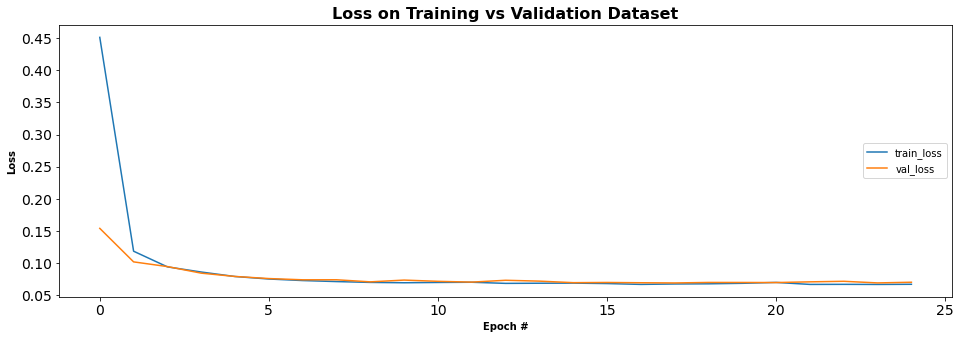

In [67]:
# plot the training/validation loss
fig= plt.figure(figsize = [16,5])
plt.plot(np.arange(0, EPOCHES), modelHistory.history["loss"], label="train_loss")
plt.plot(np.arange(0, EPOCHES), modelHistory.history["val_loss"], label="val_loss")
plt.title("Loss on Training vs Validation Dataset", weight="bold")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Loss", weight="bold")
plt.legend(loc="right");
plt.show()

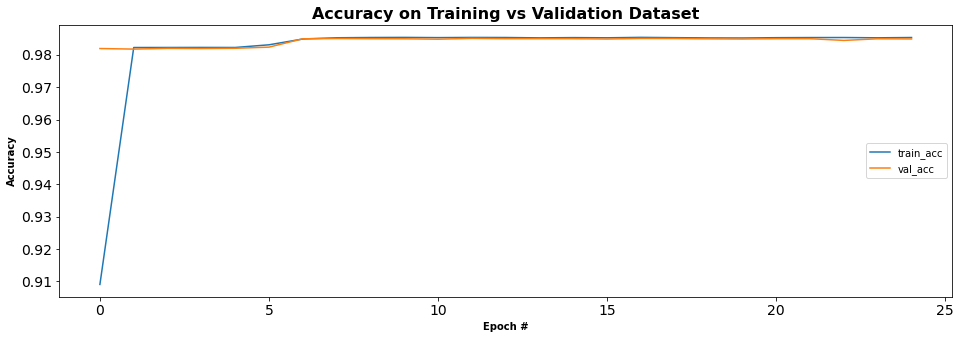

In [68]:
# plot the training/validation accuracy
fig = plt.figure(figsize = [16,5])
plt.plot(np.arange(0, EPOCHES), modelHistory.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, EPOCHES), modelHistory.history["val_accuracy"], label="val_acc")
plt.title("Accuracy on Training vs Validation Dataset", weight="bold")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Accuracy", weight="bold")
plt.legend(loc="right");
plt.show()

### Creating the second Model with 5 Hidden Layers

In [69]:
model2 = KerasClassifier(build_fn=createModel2,epochs=EPOCHES,batch_size=BS)

In [70]:
modelHistory2= model2.fit(X_TrainedScaled, Y_Train.values.ravel(), 
                          validation_data=(X_TestScaled, Y_Test.values.ravel()),verbose=1, validation_split=0.1)

Epoch 1/25
17785/17785 [==============================] - 12s 657us/step - loss: 0.6280 - accuracy: 0.7273 - val_loss: 0.3964 - val_accuracy: 0.7853
Epoch 2/25
17785/17785 [==============================] - 12s 669us/step - loss: 0.1694 - accuracy: 0.9705 - val_loss: 0.1008 - val_accuracy: 0.9820
Epoch 3/25
17785/17785 [==============================] - 12s 662us/step - loss: 0.0839 - accuracy: 0.9823 - val_loss: 0.0716 - val_accuracy: 0.9820
Epoch 4/25
17785/17785 [==============================] - 12s 696us/step - loss: 0.0630 - accuracy: 0.9823 - val_loss: 0.0560 - val_accuracy: 0.9820
Epoch 5/25
17785/17785 [==============================] - 12s 698us/step - loss: 0.0522 - accuracy: 0.9847 - val_loss: 0.0503 - val_accuracy: 0.9858
Epoch 6/25
17785/17785 [==============================] - 12s 665us/step - loss: 0.0471 - accuracy: 0.9866 - val_loss: 0.0445 - val_accuracy: 0.9861
Epoch 7/25
17785/17785 [==============================] - 12s 664us/step - loss: 0.0444 - accuracy: 0.9867

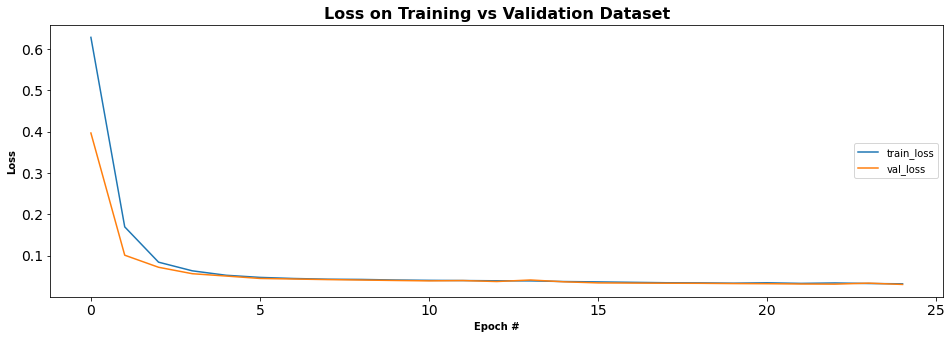

In [71]:
# plot the training/validation loss
fig= plt.figure(figsize = [16,5])
plt.plot(np.arange(0, EPOCHES), modelHistory2.history["loss"], label="train_loss")
plt.plot(np.arange(0, EPOCHES), modelHistory2.history["val_loss"], label="val_loss")
plt.title("Loss on Training vs Validation Dataset", weight="bold")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Loss", weight="bold")
plt.legend(loc="right");
plt.show()

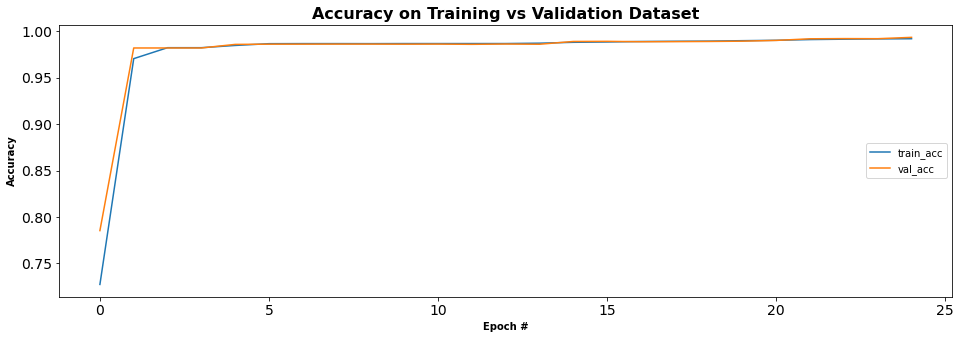

In [72]:
# plot the training/validation accuracy
fig = plt.figure(figsize = [16,5])
plt.plot(np.arange(0, EPOCHES), modelHistory2.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, EPOCHES), modelHistory2.history["val_accuracy"], label="val_acc")
plt.title("Accuracy on Training vs Validation Dataset", weight="bold")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Accuracy", weight="bold")
plt.legend(loc="right");
#plt.xlim(0,20)
#plt.ylim(0.99900,1)
plt.show()

## Neural Network Visualization

In [73]:
plotNN()

In [74]:
IFrame("network.gv.pdf", width=900, height=400)

## Neural Network Classification Report

In [75]:
#creating another model for the classification report
modelReport = KerasClassifier(build_fn=createModel2,epochs=EPOCHES,batch_size=BS)
modelReport.fit(X_TrainedScaled, Y_Train.values.ravel(),verbose=1, validation_split=0.1)
#predicting our Model
y_predNN = modelReport.predict(X_TestScaled)

Epoch 1/25
17785/17785 [==============================] - 12s 677us/step - loss: 0.4877 - accuracy: 0.8777 - val_loss: 0.1511 - val_accuracy: 0.9820
Epoch 2/25
17785/17785 [==============================] - 12s 673us/step - loss: 0.1141 - accuracy: 0.9822 - val_loss: 0.0999 - val_accuracy: 0.9819
Epoch 3/25
17785/17785 [==============================] - 12s 673us/step - loss: 0.0876 - accuracy: 0.9822 - val_loss: 0.0734 - val_accuracy: 0.9820
Epoch 4/25
17785/17785 [==============================] - 12s 678us/step - loss: 0.0626 - accuracy: 0.9823 - val_loss: 0.0550 - val_accuracy: 0.9820
Epoch 5/25
17785/17785 [==============================] - 12s 687us/step - loss: 0.0511 - accuracy: 0.9840 - val_loss: 0.0472 - val_accuracy: 0.9861
Epoch 6/25
17785/17785 [==============================] - 12s 669us/step - loss: 0.0462 - accuracy: 0.9866 - val_loss: 0.0437 - val_accuracy: 0.9860
Epoch 7/25
17785/17785 [==============================] - 12s 698us/step - loss: 0.0436 - accuracy: 0.9867

In [76]:
#Getting the accuracy using metrics library
NNAccuracy = metrics.accuracy_score(Y_Test, y_predNN)

#getting the classification report for each attack
NNReport = metrics.classification_report(Y_Test, y_predNN, sample_weight=None, 
                                         digits=2,output_dict=False)

C:\Users\Bryan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [77]:
#printing the results
print(f'Accuracy = {NNAccuracy}')
print(f' Classification Report =\n {NNReport}')

Accuracy = 0.9641819745964273
 Classification Report =
                   precision    recall  f1-score   support

           back.       0.00      0.00      0.00       439
buffer_overflow.       0.00      0.00      0.00         7
      ftp_write.       0.00      0.00      0.00         5
   guess_passwd.       0.00      0.00      0.00         8
           imap.       0.00      0.00      0.00         2
        ipsweep.       0.22      0.98      0.36       262
           land.       0.00      0.00      0.00         1
     loadmodule.       0.00      0.00      0.00         1
       multihop.       0.00      0.00      0.00         1
        neptune.       1.00      1.00      1.00     21520
           nmap.       0.00      0.00      0.00        44
         normal.       0.95      0.89      0.92     19479
            pod.       0.00      0.00      0.00        51
      portsweep.       0.00      0.00      0.00       212
        rootkit.       0.00      0.00      0.00         2
          satan

In [78]:
#getting the features and target names
featuresNames = dfTrainFinal.columns.values.tolist()
targets = dfTrainFinal.label.unique()
#removing the label name since it is the target
featuresNames.remove('label')

## Decision Tree

In [79]:
#creating a Decision Tree
decision_tree = createModelDT()

In [80]:
#fiting our data into our model
decision_tree.fit(X_TrainedScaled, Y_Train)

DecisionTreeClassifier(class_weight='balanced')

In [81]:
#predicting our Model
y_predDT = decision_tree.predict(X_TestScaled)

In [82]:
#Getting the accuracy using metrics library
DTAccuracy = metrics.accuracy_score(Y_Test, y_predDT)

#getting the classification report for each attack
DTReport = metrics.classification_report(Y_Test, y_predDT, sample_weight=None, 
                                         digits=2,output_dict=False)

C:\Users\Bryan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [83]:
#printing the results
print(f'Accuracy = {DTAccuracy}')
print(f' Classification Report =\n {DTReport}')

Accuracy = 0.7654774555943525
 Classification Report =
                   precision    recall  f1-score   support

           back.       0.00      0.00      0.00       439
buffer_overflow.       1.00      0.43      0.60         7
      ftp_write.       0.14      0.20      0.17         5
   guess_passwd.       1.00      1.00      1.00         8
           imap.       1.00      1.00      1.00         2
        ipsweep.       0.94      0.06      0.11       262
           land.       1.00      1.00      1.00         1
     loadmodule.       0.00      0.00      0.00         1
       multihop.       0.00      0.00      0.00         1
        neptune.       0.97      0.00      0.00     21520
           nmap.       0.00      0.00      0.00        44
         normal.       0.46      0.98      0.62     19479
            pod.       0.93      1.00      0.96        51
      portsweep.       1.00      0.92      0.96       212
        rootkit.       0.00      0.00      0.00         2
          satan

In [84]:
#ploting our tree
plotTree(decision_tree, featuresNames, targets)

## Random Forest Model

In [91]:
#variables for Random Forest
nEstimators =10
maxDepth= 30
randomState = 20;

In [92]:
#Creatiung random Forest model
modelRF = createModelRF(nEstimators, maxDepth, randomState)
modelRF.fit(X_TrainedScaled, Y_Train)

RandomForestClassifier(max_depth=30, n_estimators=10, random_state=20)

In [93]:
#predicting our Model
y_pred = modelRF.predict(X_TestScaled)

In [94]:
#Getting the accuracy using metrics library
RFAccuracy = metrics.accuracy_score(Y_Test, y_pred)

#getting the classification report for each attack
RFReport = metrics.classification_report(Y_Test, y_pred, sample_weight=None, 
                                         digits=2,output_dict=False)

C:\Users\Bryan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [95]:
#printing the results
print(f'Accuracy = {RFAccuracy}')
print(f' Classification Report =\n {RFReport}')

Accuracy = 0.9430089570365873
 Classification Report =
                   precision    recall  f1-score   support

           back.       1.00      0.02      0.04       439
buffer_overflow.       1.00      0.43      0.60         7
      ftp_write.       0.00      0.00      0.00         5
   guess_passwd.       0.00      0.00      0.00         8
           imap.       0.00      0.00      0.00         2
        ipsweep.       1.00      0.00      0.01       262
           land.       1.00      1.00      1.00         1
     loadmodule.       0.00      0.00      0.00         1
       multihop.       0.00      0.00      0.00         1
        neptune.       1.00      0.81      0.89     21520
           nmap.       0.00      0.00      0.00        44
         normal.       0.78      1.00      0.87     19479
            pod.       1.00      0.43      0.60        51
      portsweep.       0.00      0.00      0.00       212
        rootkit.       0.00      0.00      0.00         2
          satan

In [96]:
#ploting one tree
plotTree(modelRF.estimators_[0], featuresNames, targets)

In [97]:
#plutting multiple estimator tree 
plotMultipleTrees(modelRF, featuresNames, targets, 5)

## Why we have better performance with a RF than DT ?

- Random forest leverages the power of multiple decision trees. 
- It does not rely on the feature importance given by a single decision tree.

# NEXT OPTION

## Option 2: Remove the object columns

In [98]:
#dropping the columns that are object types
df2 = df.drop(['service', 'flag', 'protocol_type'], axis=1)

In [99]:
print(f'Original:{df.shape} New DF: {df2.shape} ')

Original:(494021, 42) New DF: (494021, 39) 


In [100]:
#splitting the data
dfTrain2, dfTest2 = train_test_split(df2, test_size=0.2)

In [101]:
#splitting the data into X and Y for the train dataset
X_Train2 = dfTrain2.drop('label',1)
Y_Train2 = dfTrain2.label

In [102]:
#splitting the data into X and Y for the testing dataset
X_Test2 = dfTest2.drop('label',1)
Y_Test2 = dfTest2.label

In [103]:
print(X_Train2.shape, X_Test2.shape)
print(Y_Train2.shape, Y_Test2.shape)

(395216, 38) (98805, 38)
(395216,) (98805,)


In [104]:
#scaling the data
X_TrainedScaled2=scaleData(X_Train2)
X_TestScaled2=scaleData(X_Test2) 


In [105]:
#creatiing our first model with 3 layers
model2 = KerasClassifier(build_fn=createModelWithout,epochs=EPOCHES,batch_size=BS)

In [106]:
modelHistory2= model2.fit(X_TrainedScaled2, Y_Train2.values.ravel(), 
                        validation_data=(X_TestScaled2, Y_Test2.values.ravel()),verbose=1, validation_split=0.1)

Epoch 1/25
17785/17785 [==============================] - 10s 590us/step - loss: 0.6219 - accuracy: 0.7338 - val_loss: 0.4060 - val_accuracy: 0.7851
Epoch 2/25
17785/17785 [==============================] - 11s 595us/step - loss: 0.1849 - accuracy: 0.9618 - val_loss: 0.1191 - val_accuracy: 0.9794
Epoch 3/25
17785/17785 [==============================] - 10s 587us/step - loss: 0.0990 - accuracy: 0.9812 - val_loss: 0.0950 - val_accuracy: 0.9795
Epoch 4/25
17785/17785 [==============================] - 10s 584us/step - loss: 0.0825 - accuracy: 0.9812 - val_loss: 0.0826 - val_accuracy: 0.9794
Epoch 5/25
17785/17785 [==============================] - 10s 588us/step - loss: 0.0731 - accuracy: 0.9812 - val_loss: 0.0754 - val_accuracy: 0.9794
Epoch 6/25
17785/17785 [==============================] - 10s 589us/step - loss: 0.0679 - accuracy: 0.9813 - val_loss: 0.0711 - val_accuracy: 0.9799
Epoch 7/25
17785/17785 [==============================] - 10s 587us/step - loss: 0.0648 - accuracy: 0.9845

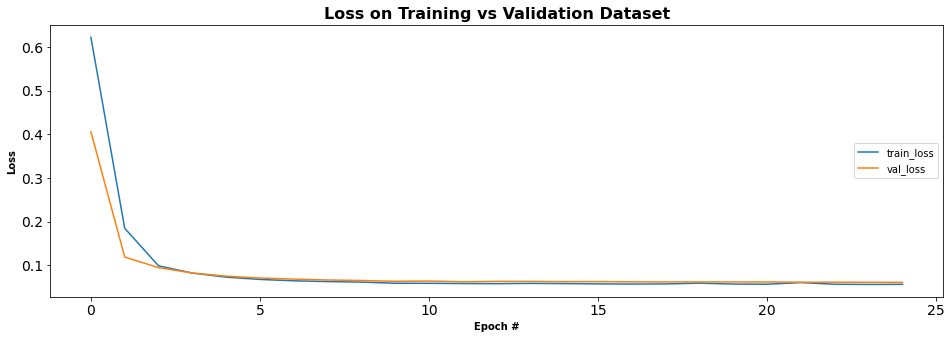

In [107]:
# plot the training/validation loss
fig= plt.figure(figsize = [16,5])
plt.plot(np.arange(0, EPOCHES), modelHistory2.history["loss"], label="train_loss")
plt.plot(np.arange(0, EPOCHES), modelHistory2.history["val_loss"], label="val_loss")
plt.title("Loss on Training vs Validation Dataset", weight="bold")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Loss", weight="bold")
plt.legend(loc="right");
plt.show()

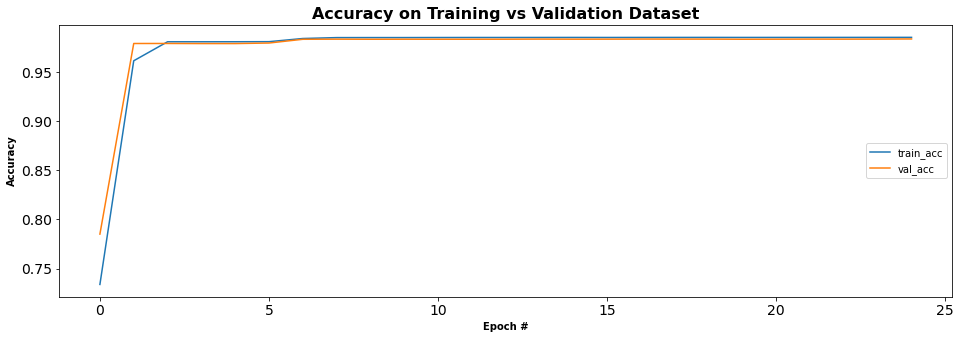

In [108]:
# plot the training/validation accuracy
fig = plt.figure(figsize = [16,5])
plt.plot(np.arange(0, EPOCHES), modelHistory2.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, EPOCHES), modelHistory2.history["val_accuracy"], label="val_acc")
plt.title("Accuracy on Training vs Validation Dataset", weight="bold")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Accuracy", weight="bold")
plt.legend(loc="right");
plt.show()

In [109]:
#creating another model for the classification report
modelReport2 = KerasClassifier(build_fn=createModelWithout,epochs=EPOCHES,batch_size=BS)

In [110]:
modelReport2.fit(X_TrainedScaled2, Y_Train2.values.ravel(),verbose=1, validation_split=0.1)
#predicting our Model
y_predNN2 = modelReport2.predict(X_TestScaled2)

Epoch 1/25
17785/17785 [==============================] - 10s 583us/step - loss: 0.4633 - accuracy: 0.8996 - val_loss: 0.1544 - val_accuracy: 0.9805
Epoch 2/25
17785/17785 [==============================] - 10s 583us/step - loss: 0.1170 - accuracy: 0.9820 - val_loss: 0.1088 - val_accuracy: 0.9804
Epoch 3/25
17785/17785 [==============================] - 10s 578us/step - loss: 0.0944 - accuracy: 0.9819 - val_loss: 0.0875 - val_accuracy: 0.9804
Epoch 4/25
17785/17785 [==============================] - 11s 597us/step - loss: 0.0733 - accuracy: 0.9820 - val_loss: 0.0692 - val_accuracy: 0.9804
Epoch 5/25
17785/17785 [==============================] - 10s 584us/step - loss: 0.0604 - accuracy: 0.9821 - val_loss: 0.0622 - val_accuracy: 0.9804
Epoch 6/25
17785/17785 [==============================] - 10s 585us/step - loss: 0.0551 - accuracy: 0.9855 - val_loss: 0.0561 - val_accuracy: 0.9848
Epoch 7/25
17785/17785 [==============================] - 10s 583us/step - loss: 0.0512 - accuracy: 0.9863

In [111]:
#Getting the accuracy using metrics library
NNAccuracy2 = metrics.accuracy_score(Y_Test2, y_predNN2)

#getting the classification report for each attack
NNReport2 = metrics.classification_report(Y_Test2, y_predNN2, sample_weight=None, 
                                         digits=2,output_dict=False)

C:\Users\Bryan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [112]:
#printing the results
print(f'Accuracy = {NNAccuracy2}')
print(f' Classification Report =\n {NNReport2}')

Accuracy = 0.9851728151409341
 Classification Report =
                   precision    recall  f1-score   support

           back.       0.02      0.01      0.01       449
buffer_overflow.       0.00      0.00      0.00         8
      ftp_write.       0.00      0.00      0.00         2
   guess_passwd.       0.00      0.00      0.00         7
           imap.       0.00      0.00      0.00         3
        ipsweep.       0.00      0.00      0.00       255
           land.       0.00      0.00      0.00         2
     loadmodule.       0.00      0.00      0.00         4
        neptune.       1.00      1.00      1.00     21378
           nmap.       0.00      0.00      0.00        41
         normal.       0.99      1.00      0.99     19245
           perl.       0.00      0.00      0.00         1
            phf.       0.00      0.00      0.00         1
            pod.       0.00      0.00      0.00        37
      portsweep.       0.00      0.00      0.00       198
          satan

## Adding or Removing Columns, worth it ?

## Results and Accuracies

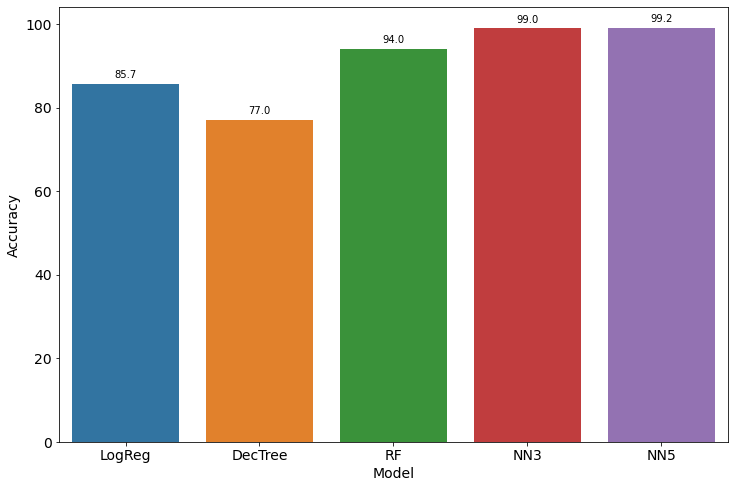

In [114]:
plotResults(DTAccuracy,RFAccuracy,NNAccuracy)

## Conclusion

After all the models created, we ended up with our Neural Network Model outperforming a Random Forest Model, Decision Tree Model, and probably a Logistic Regresion Model